### CMPE 256 Class Presentation - VAR Commodity Pricing Model - Gold & Silver ###
###### Covers: Book Topics: Machine Learning and Artificial Intelligence for Agricultural Economics: Prognostic Data Analytics to Serve Small Scale Farmers Worldwide, Publisher :  Springer; 1st ed. 2021 edition (October 5, 2021), ISBN-13: 978-3030774844 ######

https://towardsdatascience.com/granger-causality-and-vector-auto-regressive-model-for-time-series-forecasting-3226a64889a6

***FORECASTING of Gold and Oil*** have garnered major attention from academics, investors and Government agencies like. These two products are known for their substantial influence on global economy. I will show here, how to use Granger’s Causality Test to test the relationships of multiple variables in the time series and Vector Auto Regressive Model (VAR) to forecast the future Gold & Oil prices from the historical data of ***Gold prices, Silver prices, Crude Oil prices, Stock index , Interest Rate and USD rate***.

https://www.lbma.org.uk/prices-and-data/precious-metal-prices#/
https://fred.stlouisfed.org/series/FEDFUNDS

In [150]:
import logging
import pandas as pd
import numpy as np
from numpy import random 
import nltk
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.metrics import accuracy_score, confusion_matrix
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
import re
from bs4 import BeautifulSoup
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import scipy.stats as spstats
import seaborn as sns # uncomment these if you have them
import impyute as imp


%matplotlib inline
mpl.style.reload_library()
mpl.style.use('classic')
mpl.rcParams['figure.facecolor'] = (1, 1, 1, 0)
mpl.rcParams['figure.figsize'] = [6.0, 4.0]
mpl.rcParams['figure.dpi'] = 40

In [151]:
! pip install seaborn

In [152]:
# TODO: Add code to unzip the zip file into the DataSources folder

<H1> Gold Dataset </H1> <H3> Load Gold Dataset and set Date as Index. </H3>

In [153]:
#Gold price data
goldDF = pd.read_csv("./DataSources/lbma_gold_am_usd_1967-12-31_2022-03-31.csv",parse_dates=['Date'], dayfirst=True)
goldDF = goldDF.set_index('Date')
goldDF.head()


/var/folders/b8/b_prs9t152qc96jlgz5zhwt00000gn/T/ipykernel_16326/1401665623.py:2: UserWarning: Parsing dates in %m/%d/%Y format when dayfirst=True was specified. Pass `dayfirst=False` or specify a format to silence this warning.
  goldDF = pd.read_csv("./DataSources/lbma_gold_am_usd_1967-12-31_2022-03-31.csv",parse_dates=['Date'], dayfirst=True)


,GoldPrice
Date,
2022-03-31,1924.10
2022-03-30,1917.80
2022-03-29,1911.05
2022-03-28,1927.00
2022-03-25,1956.65


<h3> Check for nulls </H3>

In [154]:
goldDF.isnull().sum() ## missing values

GoldPrice    0
dtype: int64

In [155]:
goldDF.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 13712 entries, 2022-03-31 to 1968-01-02
Data columns (total 1 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   GoldPrice  13712 non-null  float64
dtypes: float64(1)
memory usage: 214.2 KB


In [156]:
goldDF.columns

Index(['GoldPrice'], dtype='object')

Text(0, 0.5, 'Frequency')

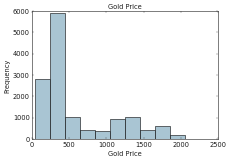

In [157]:
 
fig, ax = plt.subplots()
goldDF['GoldPrice'].hist(color='#A9C5D3', edgecolor='black',  
                          grid=False)
ax.set_title('Gold Price', fontsize=12)
ax.set_xlabel('Gold Price', fontsize=12)
ax.set_ylabel('Frequency', fontsize=12)

<h5> Create Gold Price Bins - divide price into five quantiles (0, 25%, 50%, 75%, and 100%) </h5>

In [158]:
goldDF['GoldPrice_bin_round'] = np.array(np.floor(
                              np.array(goldDF['GoldPrice']) / 10.))
goldDF[['GoldPrice', 'GoldPrice_bin_round']].iloc[1071:2076]

,GoldPrice,GoldPrice_bin_round
Date,,
2018-01-08,1318.80,131.0
2018-01-05,1317.90,131.0
2018-01-04,1313.70,131.0
2018-01-03,1314.60,131.0
2018-01-02,1312.80,131.0
2017-12-29,1296.50,129.0
2017-12-28,1291.60,129.0
2017-12-27,1285.40,128.0
2017-12-22,1268.05,126.0


In [159]:
quantile_list = [0, .25, .5, .75, 1.]
quantiles = goldDF['GoldPrice'].quantile(quantile_list)
quantiles

0.00      34.780
0.25     281.775
0.50     384.000
0.75     892.250
1.00    2061.500
Name: GoldPrice, dtype: float64

Text(0, 0.5, 'Frequency')

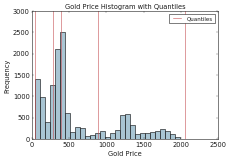

In [160]:
fig, ax = plt.subplots()
goldDF['GoldPrice'].hist(bins=30, color='#A9C5D3', 
                             edgecolor='black', grid=False)
for quantile in quantiles:
    qvl = plt.axvline(quantile, color='r')
ax.legend([qvl], ['Quantiles'], fontsize=10)
ax.set_title('Gold Price Histogram with Quantiles', 
             fontsize=12)
ax.set_xlabel('Gold Price', fontsize=12)
ax.set_ylabel('Frequency', fontsize=12)

In [161]:
goldDF['GoldPrice_log'] = np.log((1+ goldDF['GoldPrice']))
goldDF[[ 'GoldPrice', 'GoldPrice_log']].iloc[4:9]

,GoldPrice,GoldPrice_log
Date,,
2022-03-25,1956.65,7.579500
2022-03-24,1945.90,7.573994
2022-03-23,1932.15,7.566906
2022-03-22,1929.35,7.565457
2022-03-21,1925.05,7.563227


Text(11.5, 450, '$\\mu$=5.96')

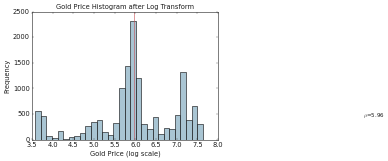

In [162]:
goldprice_log_mean = np.round(np.mean(goldDF['GoldPrice_log']), 2)
fig, ax = plt.subplots()
goldDF['GoldPrice_log'].hist(bins=30, color='#A9C5D3', 
                                 edgecolor='black', grid=False)
plt.axvline(goldprice_log_mean, color='r')
ax.set_title('Gold Price Histogram after Log Transform', 
             fontsize=12)
ax.set_xlabel('Gold Price (log scale)', fontsize=12)
ax.set_ylabel('Frequency', fontsize=12)
ax.text(11.5, 450, r'$\mu$='+str(goldprice_log_mean), fontsize=10)

In [163]:
goldprice = np.array(goldDF['GoldPrice'])
goldprice_clean = goldprice[~np.isnan(goldprice)]
l, opt_lambda = spstats.boxcox(goldprice_clean)
print('Optimal lambda value:', opt_lambda)

Optimal lambda value: 0.22789603130062897


In [164]:
goldDF['goldprice_boxcox_lambda_0'] = spstats.boxcox(
                                        (1+goldDF['GoldPrice']), 
                                          lmbda=0)
goldDF['goldprice_boxcox_lambda_opt'] = spstats.boxcox(
                                            goldDF['GoldPrice'], 
                                              lmbda=opt_lambda)

goldDF[['GoldPrice', 'GoldPrice_log', 
               'goldprice_boxcox_lambda_0',       
               'goldprice_boxcox_lambda_opt']].iloc[4:9]

,GoldPrice,GoldPrice_log,goldprice_boxcox_lambda_0,goldprice_boxcox_lambda_opt
Date,,,,
2022-03-25,1956.65,7.579500,7.579500,20.294357
2022-03-24,1945.90,7.573994,7.573994,20.263387
2022-03-23,1932.15,7.566906,7.566906,20.223581
2022-03-22,1929.35,7.565457,7.565457,20.215448
2022-03-21,1925.05,7.563227,7.563227,20.202941


Text(24, 450, '$\\mu$=13.11')

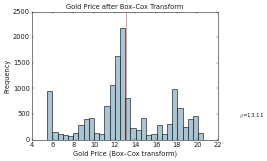

In [165]:
goldprice_boxcox_mean = np.round(
                      np.mean(
                       goldDF['goldprice_boxcox_lambda_opt']),2)
fig, ax = plt.subplots()
goldDF['goldprice_boxcox_lambda_opt'].hist(bins=30, 
                     color='#A9C5D3', edgecolor='black', grid=False)
plt.axvline(goldprice_boxcox_mean, color='r')
ax.set_title('Gold Price after Box–Cox Transform', 
             fontsize=12)
ax.set_xlabel('Gold Price (Box–Cox transform)', fontsize=12)
ax.set_ylabel('Frequency', fontsize=12)
ax.text(24, 450, r'$\mu$='+str(goldprice_boxcox_mean), fontsize=10)

In [166]:
#Silver price data
silverDF = pd.read_csv("./DataSources/lbma_silver_am_usd_1967-12-31_2022-03-31.csv",parse_dates=['Date'], dayfirst=True)
silverDF = silverDF.set_index('Date')
silverDF.head()


/var/folders/b8/b_prs9t152qc96jlgz5zhwt00000gn/T/ipykernel_16326/2365473469.py:2: UserWarning: Parsing dates in %m/%d/%Y format when dayfirst=True was specified. Pass `dayfirst=False` or specify a format to silence this warning.
  silverDF = pd.read_csv("./DataSources/lbma_silver_am_usd_1967-12-31_2022-03-31.csv",parse_dates=['Date'], dayfirst=True)


,SilverPrice
Date,
2022-03-31,24.815
2022-03-30,24.755
2022-03-29,24.640
2022-03-28,24.905
2022-03-25,25.620


In [167]:
silverDF.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 13723 entries, 2022-03-31 to 1968-01-02
Data columns (total 1 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   SilverPrice  13704 non-null  float64
dtypes: float64(1)
memory usage: 214.4 KB


In [168]:
silverDF.isnull().sum() ## missing values

SilverPrice    19
dtype: int64

In [169]:
mean_imputation_silverDF = silverDF.copy()
mean_imputation_silverDF['SilverPrice_Mean_Filled'] = mean_imputation_silverDF['SilverPrice'].fillna(silverDF['SilverPrice'].mean())

In [170]:
silverDF.SilverPrice.describe().T

count    13704.000000
mean         9.852661
std          7.993719
min          1.272000
25%          4.615000
50%          5.985500
75%         14.820000
max         49.450000
Name: SilverPrice, dtype: float64

In [171]:
mean_imputation_silverDF.SilverPrice.describe().T

count    13704.000000
mean         9.852661
std          7.993719
min          1.272000
25%          4.615000
50%          5.985500
75%         14.820000
max         49.450000
Name: SilverPrice, dtype: float64

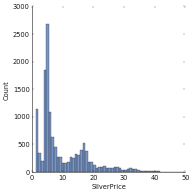

In [172]:
sns.displot(silverDF, x="SilverPrice")

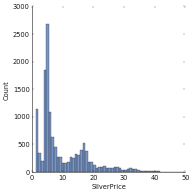

In [173]:
sns.displot(mean_imputation_silverDF, x="SilverPrice")

In [174]:
silverDF['SilverPrice_log'] = np.log((1+ silverDF['SilverPrice']))
silverDF[[ 'SilverPrice', 'SilverPrice_log']].iloc[4:9]

,SilverPrice,SilverPrice_log
Date,,
2022-03-25,25.620,3.281663
2022-03-24,25.315,3.270139
2022-03-23,25.015,3.258673
2022-03-22,25.085,3.261360
2022-03-21,25.035,3.259442


Text(11.5, 450, '$\\mu$=2.15')

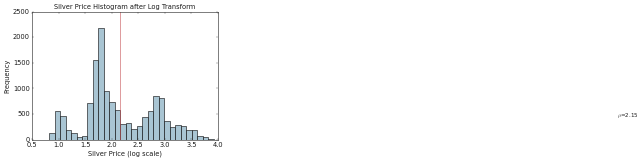

In [175]:

silverprice_log_mean = np.round(np.mean(silverDF['SilverPrice_log']), 2)
fig, ax = plt.subplots()
silverDF['SilverPrice_log'].hist(bins=30, color='#A9C5D3', 
                                 edgecolor='black', grid=False)
plt.axvline(silverprice_log_mean, color='r')
ax.set_title('Silver Price Histogram after Log Transform', 
             fontsize=12)
ax.set_xlabel('Silver Price (log scale)', fontsize=12)
ax.set_ylabel('Frequency', fontsize=12)
ax.text(11.5, 450, r'$\mu$='+str(silverprice_log_mean), fontsize=10)

In [176]:
! pip install impyute

In [177]:
 silverDF

,SilverPrice,SilverPrice_log
Date,,
2022-03-31,24.815,3.250956
2022-03-30,24.755,3.248629
2022-03-29,24.640,3.244154
2022-03-28,24.905,3.254436
2022-03-25,25.620,3.281663
2022-03-24,25.315,3.270139
2022-03-23,25.015,3.258673
2022-03-22,25.085,3.261360
2022-03-21,25.035,3.259442


In [178]:
# USD Index
# Trade Weighted U.S. Dollar Index: Broad, Goods and Services (DTWEXBGS)
# https://fred.stlouisfed.org/series/DTWEXBGS 
usdFedFundsDF = pd.read_csv("./DataSources/FEDFUNDS_2022-03-31.csv",parse_dates=['Date'], dayfirst=True)


usdFedFundsDF = usdFedFundsDF.set_index('Date')

usdFedFundsDF.head() 

,FEDFUNDS
Date,
1954-01-07,0.80
1954-01-08,1.22
1954-01-09,1.07
1954-01-10,0.85
1954-01-11,0.83


In [179]:
usdFedFundsDF.tail(10)

,FEDFUNDS
Date,
2021-01-06,0.08
2021-01-07,0.10
2021-01-08,0.09
2021-01-09,0.08
2021-01-10,0.08
2021-01-11,0.08
2021-01-12,0.08
2022-01-01,0.08
2022-01-02,0.08


In [180]:
usdFedFundsDF.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 813 entries, 1954-01-07 to 2022-01-03
Data columns (total 1 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   FEDFUNDS  813 non-null    float64
dtypes: float64(1)
memory usage: 12.7 KB


In [181]:
usdFedFundsDF.isnull().sum() ## missing values

FEDFUNDS    0
dtype: int64

In [182]:
# Interest
# 10-Year Treasury Constant Maturity Rate (DGS10)
# https://fred.stlouisfed.org/series/DGS10

### https://fred.stlouisfed.org/series/FEDFUNDS
interestRateDF = pd.read_csv("./DataSources/DGS10.csv",parse_dates=['DATE'], dayfirst=True)
interestRateDF = interestRateDF.rename(columns={"DATE":'Date'})

interestRateDF = interestRateDF.set_index('Date')

interestRateDF.head() 

,DGS10
Date,
1962-01-02,4.06
1962-01-03,4.03
1962-01-04,3.99
1962-01-05,4.02
1962-01-08,4.03


In [183]:
interestRateDF.tail(10)

,DGS10
Date,
2022-04-06,2.61
2022-04-07,2.66
2022-04-08,2.72
2022-04-11,2.79
2022-04-12,2.72
2022-04-13,2.70
2022-04-14,2.83
2022-04-15,.
2022-04-18,2.85


In [184]:
interestRateDF['DGS10'] = interestRateDF['DGS10'].replace('.',np.nan)

In [185]:
interestRateDF.isnull().sum() ## missing values

DGS10    671
dtype: int64

In [186]:
interestRateDF.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15731 entries, 1962-01-02 to 2022-04-19
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   DGS10   15060 non-null  object
dtypes: object(1)
memory usage: 245.8+ KB


In [187]:
interestRateDF.isnull().sum() ## missing values

DGS10    671
dtype: int64

In [188]:
# S&P Index
# https://finance.yahoo.com/quote/%5EGSPC/history?period1=-1325635200&period2=1611360000&interval=1d&filter=history&frequency=1d&includeAdjustedClose=true
# https://finance.yahoo.com/quote/%5EGSPC/history?period1=-628819200&period2=1650412800&interval=1d&filter=history&frequency=1d&includeAdjustedClose=true
spindex500Index = pd.read_csv("./DataSources/SPIndex_2022-03-31.csv",parse_dates=['Date'], dayfirst=True)

spindex500Index = spindex500Index.set_index('Date')

spindex500Index.info()

/var/folders/b8/b_prs9t152qc96jlgz5zhwt00000gn/T/ipykernel_16326/1427381559.py:4: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  spindex500Index = pd.read_csv("./DataSources/SPIndex_2022-03-31.csv",parse_dates=['Date'], dayfirst=True)


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 14100 entries, 2022-04-19 to 2066-04-14
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Open         14100 non-null  object
 1   High         14100 non-null  object
 2   Low          14100 non-null  object
 3   Close*       14100 non-null  object
 4   Adj Close**  14100 non-null  object
 5   Volume       14100 non-null  object
dtypes: object(6)
memory usage: 771.1+ KB


In [189]:
spindex500Index.isnull().sum() ## missing values

Open           0
High           0
Low            0
Close*         0
Adj Close**    0
Volume         0
dtype: int64

In [190]:
spindex500Index.columns

Index(['Open', 'High', 'Low', 'Close*', 'Adj Close**', 'Volume'], dtype='object')

In [191]:

spindex500Index = spindex500Index.drop('Open', axis=1)
spindex500Index = spindex500Index.drop('High', axis=1)
spindex500Index = spindex500Index.drop('Low', axis=1)
spindex500Index = spindex500Index.drop('Close*', axis=1)
spindex500Index = spindex500Index.drop('Volume', axis=1)

In [192]:



spindex500Index= spindex500Index.rename(columns={'Adj Close**':'AdjClose'})


In [193]:
spindex500Index['AdjClose'] = spindex500Index['AdjClose'].replace(',', '')

In [194]:
pd.Series(spindex500Index.index).describe()

count                            14100
mean     2006-02-18 20:48:24.510638336
min                1973-01-02 00:00:00
25%                1986-12-11 18:00:00
50%                2000-11-21 12:00:00
75%                2014-11-28 18:00:00
max                2072-12-29 00:00:00
Name: Date, dtype: object

In [195]:
dt_idx_start = spindex500Index.index.get_loc(pd.to_datetime('1973-01-02'))
dt_idx_end = spindex500Index.index.get_loc(pd.to_datetime('2072-12-29'))

In [196]:
spindex500Index.iloc[dt_idx_start:]
#spindex500Index

,AdjClose
Date,
1973-01-02,119.1
2072-12-29,118.05
2072-12-27,116.93
2072-12-26,116.3
2072-12-22,115.83
2072-12-21,115.11
2072-12-20,115.95
2072-12-19,116.34
2072-12-18,116.9


In [197]:
# Crude Oil Prices: West Texas Intermediate (WTI) - Cushing, Oklahoma
# https://fred.stlouisfed.org/series/DCOILWTICO
oilPricesDF = pd.read_csv("./DataSources/DCOILWTICO_2022-03-31.csv",parse_dates=['Date'], dayfirst=True)
oilPricesDF = oilPricesDF.set_index('Date')
oilPricesDF.head()

,CrudeOilPrices(WTI)
Date,
1/2/1986,25.56
1/3/1986,26
1/6/1986,26.53
1/7/1986,25.85
1/8/1986,25.87


In [198]:
oilPricesDF['CrudeOilPrices(WTI)'] = oilPricesDF['CrudeOilPrices(WTI)'].replace('.',np.nan)

In [199]:
oilPricesDF.isnull().sum() ## missing values

CrudeOilPrices(WTI)    323
dtype: int64

In [200]:
oilPricesDF['CrudeOilPrices(WTI)']

Date
1/2/1986       25.56
1/3/1986          26
1/6/1986       26.53
1/7/1986       25.85
1/8/1986       25.87
1/9/1986       26.03
1/10/1986      25.65
1/13/1986      25.08
1/14/1986      24.97
1/15/1986      25.18
1/16/1986      23.98
1/17/1986      23.63
1/20/1986      21.33
1/21/1986      20.61
1/22/1986      20.25
1/23/1986      19.93
1/24/1986      19.45
1/27/1986      20.87
1/28/1986      19.45
1/29/1986      19.61
1/30/1986      19.58
1/31/1986      18.95
2/3/1986       17.42
2/4/1986       15.58
2/5/1986       16.28
2/6/1986        16.6
2/7/1986        17.7
2/10/1986      16.78
2/11/1986      16.28
2/12/1986      15.74
2/13/1986      16.43
2/14/1986      16.03
2/17/1986        NaN
2/18/1986       14.7
2/19/1986      15.08
2/20/1986      14.13
2/21/1986      13.63
2/24/1986      14.68
2/25/1986      14.68
2/26/1986      14.62
2/27/1986      14.05
2/28/1986      13.23
3/3/1986       11.98
3/4/1986       11.98
3/5/1986       12.03
3/6/1986       13.13
3/7/1986       12.24
3/10/198

### Exploratory analysis: ###

Let’s load the data and do some analysis with visualization to know insights of the data. Exploratory data analysis is quite extensive in multivariate time series. I will cover some areas here to get insights of the data. However, it is advisable to conduct all statistical tests to ensure our clear understanding on data distribution.

In [201]:
oilPricesDF.columns
### https://stackoverflow.com/questions/46834732/convert-pandas-datetime-column-yyyy-mm-dd-to-yyyymmdd
## https://datatofish.com/strings-to-datetime-pandas/

Index(['CrudeOilPrices(WTI)'], dtype='object')

In [202]:
pd.set_option('display.max_rows', None)
dataset = pd.concat([goldDF,silverDF,oilPricesDF,usdFedFundsDF,interestRateDF,spindex500Index], axis=1)
print('Number of colums in Dataframe : ', len(dataset.columns))
print('Number of rows in Dataframe : ', len(dataset.index))
print(dataset.head())

Number of colums in Dataframe :  11
Number of rows in Dataframe :  41215
                     GoldPrice  GoldPrice_bin_round  GoldPrice_log  \
Date                                                                 
2022-03-31 00:00:00    1924.10                192.0       7.562733   
2022-03-30 00:00:00    1917.80                191.0       7.559455   
2022-03-29 00:00:00    1911.05                191.0       7.555931   
2022-03-28 00:00:00    1927.00                192.0       7.564238   
2022-03-25 00:00:00    1956.65                195.0       7.579500   

                     goldprice_boxcox_lambda_0  goldprice_boxcox_lambda_opt  \
Date                                                                          
2022-03-31 00:00:00                   7.562733                    20.200174   
2022-03-30 00:00:00                   7.559455                    20.181804   
2022-03-29 00:00:00                   7.555931                    20.162069   
2022-03-28 00:00:00                   7.5

In [203]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Index: 41215 entries, 2022-03-31 00:00:00 to 2066-04-14 00:00:00
Data columns (total 11 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   GoldPrice                    13712 non-null  float64
 1   GoldPrice_bin_round          13712 non-null  float64
 2   GoldPrice_log                13712 non-null  float64
 3   goldprice_boxcox_lambda_0    13712 non-null  float64
 4   goldprice_boxcox_lambda_opt  13712 non-null  float64
 5   SilverPrice                  13704 non-null  float64
 6   SilverPrice_log              13704 non-null  float64
 7   CrudeOilPrices(WTI)          9145 non-null   object 
 8   FEDFUNDS                     813 non-null    float64
 9   DGS10                        15060 non-null  object 
 10  AdjClose                     14100 non-null  object 
dtypes: float64(8), object(3)
memory usage: 3.8+ MB


In [204]:
dataset.drop(['GoldPrice_bin_round','GoldPrice_log','goldprice_boxcox_lambda_0','goldprice_boxcox_lambda_opt','SilverPrice_log'], axis = 1, inplace = True, errors = 'ignore')

***Let’s fix the dates for all the series.***

In [205]:
dataset.index = pd.to_datetime(dataset.index)

In [206]:
dataset = dataset.sort_index()

In [207]:
dataset.tail()

,GoldPrice,SilverPrice,CrudeOilPrices(WTI),FEDFUNDS,DGS10,AdjClose
Date,,,,,,
2072-12-21,NaN,NaN,NaN,NaN,NaN,115.11
2072-12-22,NaN,NaN,NaN,NaN,NaN,115.83
2072-12-26,NaN,NaN,NaN,NaN,NaN,116.3
2072-12-27,NaN,NaN,NaN,NaN,NaN,116.93
2072-12-29,NaN,NaN,NaN,NaN,NaN,118.05


In [208]:
### dataset=dataset.loc['20100101':'20200824']
dt_idx_start = dataset.index.get_loc(pd.to_datetime('2000-11-21'))
dt_idx_end = dataset.index.get_loc(pd.to_datetime('2022-03-01'))


In [209]:
print(dt_idx_start) #given multiple datetime indices on the given start/end data, get loc returns a slice
print(dt_idx_end) #must select a single datetime index from these to use and slice the dataframe
dt_idx_start = dt_idx_start.start
dt_idx_end = dt_idx_end.stop

slice(22779, 22782, None)
slice(39443, 39446, None)


In [210]:
dataset = dataset.iloc[dt_idx_start:dt_idx_end]

In [211]:
dataset.isnull().sum() ## missing values

GoldPrice              11290
SilverPrice            11290
CrudeOilPrices(WTI)    11328
FEDFUNDS               16412
DGS10                  11347
AdjClose               11316
dtype: int64

In [212]:
# https://stackoverflow.com/questions/31170550/pandas-df-fillnamethod-pad-not-working-on-28000-row-df

dataset=dataset.fillna(method='pad') 
dataset = dataset.fillna(method = 'bfill')

In [213]:
dataset.isnull().sum() ## missing values

GoldPrice              0
SilverPrice            0
CrudeOilPrices(WTI)    0
FEDFUNDS               0
DGS10                  0
AdjClose               0
dtype: int64

In [214]:
dataset=dataset.dropna()
dataset.head()

,GoldPrice,SilverPrice,CrudeOilPrices(WTI),FEDFUNDS,DGS10,AdjClose
Date,,,,,,
2000-11-21,267.25,4.648,35.54,5.98,5.67,"1,347.35"
2000-11-21,267.25,4.648,35.54,5.98,5.67,"1,347.35"
2000-11-21,267.25,4.648,35.54,5.98,5.67,"1,347.35"
2000-11-22,267.25,4.648,35.54,5.98,5.62,"1,347.35"
2000-11-22,266.45,4.620,35.54,5.98,5.62,"1,322.36"


In [215]:
#print(dataset)

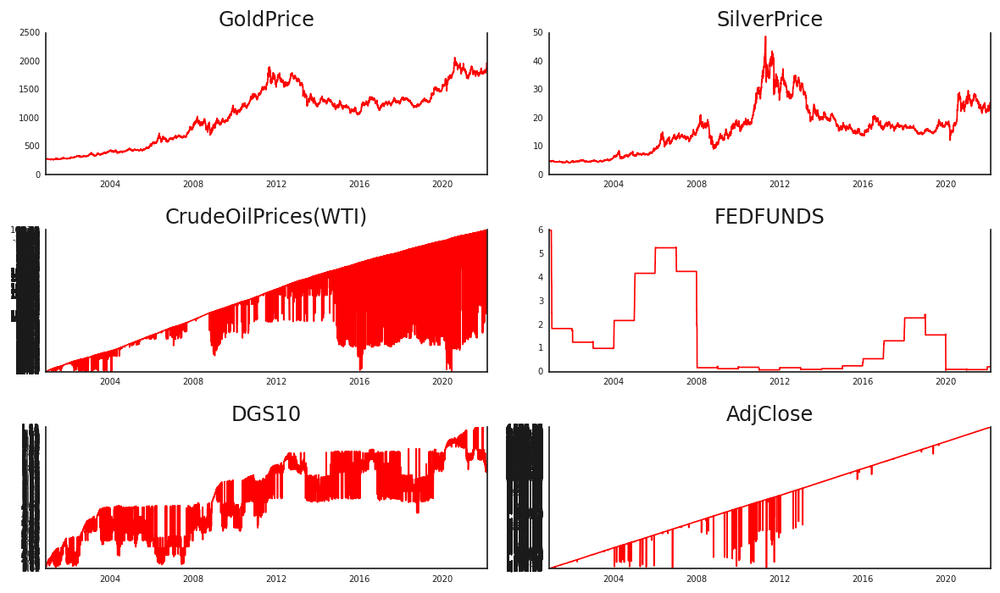

In [216]:
# Plot
fig, axes = plt.subplots(nrows=3, ncols=2, dpi=120, figsize=(10,6))
for i, ax in enumerate(axes.flatten()):
 data = dataset[dataset.columns[i]]
 ax.plot(data, color='red', linewidth=1)
 ax.set_title(dataset.columns[i])
 ax.xaxis.set_ticks_position('none')
 ax.yaxis.set_ticks_position('none')
 ax.spines["top"].set_alpha(0)
 ax.tick_params(labelsize=6)
plt.tight_layout();

***From the above plots, we can visible conclude that, all the series contain unit root with stochastic trend showing a systematic pattern that is unpredictable.***

### Normality Test ###
To extract maximum information from our data, it is important to have a ***normal or Gaussian distribution*** of the data. 
To check for that, we have done a normality test based on the Null and Alternate Hypothesis intuition.


In [217]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 16667 entries, 2000-11-21 to 2022-03-01
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   GoldPrice            16667 non-null  float64
 1   SilverPrice          16667 non-null  float64
 2   CrudeOilPrices(WTI)  16667 non-null  object 
 3   FEDFUNDS             16667 non-null  float64
 4   DGS10                16667 non-null  object 
 5   AdjClose             16667 non-null  object 
dtypes: float64(3), object(3)
memory usage: 911.5+ KB


In [218]:
itemcost='1,455.22'
itemcostProc=itemcost.replace(',','')
print(itemcostProc)
print(float(itemcostProc))

1455.22
1455.22


In [219]:
dataset['AdjClose']= dataset['AdjClose'].apply(lambda x: x.replace(',',''))

In [220]:
dataset['AdjClose']

Date
2000-11-21    1347.35
2000-11-21    1347.35
2000-11-21    1347.35
2000-11-22    1347.35
2000-11-22    1322.36
2000-11-22    1322.36
2000-11-23    1322.36
2000-11-23    1322.36
2000-11-23    1322.36
2000-11-24    1322.36
2000-11-24    1341.77
2000-11-24    1341.77
2000-11-27    1348.97
2000-11-27    1348.97
2000-11-27    1348.97
2000-11-28    1348.97
2000-11-28    1336.09
2000-11-28    1336.09
2000-11-29    1336.09
2000-11-29    1341.93
2000-11-29    1341.93
2000-11-30    1314.95
2000-11-30    1314.95
2000-11-30    1314.95
2000-12-01    1315.23
2000-12-01    1315.23
2000-12-01    1315.23
2000-12-04    1315.23
2000-12-04    1315.23
2000-12-04    1324.97
2000-12-05    1324.97
2000-12-05    1324.97
2000-12-05    1376.54
2000-12-06    1376.54
2000-12-06    1351.46
2000-12-06    1351.46
2000-12-07    1351.46
2000-12-07    1351.46
2000-12-07    1343.55
2000-12-08    1343.55
2000-12-08    1369.89
2000-12-08    1369.89
2000-12-11    1369.89
2000-12-11    1369.89
2000-12-11    1380.20
2000-

In [221]:
dataset['CrudeOilPrices(WTI)'] = dataset['CrudeOilPrices(WTI)'].astype('float64')
dataset['CrudeOilPrices(WTI)'] = dataset['CrudeOilPrices(WTI)'].astype('float64')
dataset['DGS10'] = dataset['DGS10'].astype('float64')
dataset['AdjClose'] = dataset['AdjClose'].astype('float64')
dataset.dtypes

GoldPrice              float64
SilverPrice            float64
CrudeOilPrices(WTI)    float64
FEDFUNDS               float64
DGS10                  float64
AdjClose               float64
dtype: object

In [222]:
dataset['CrudeOilPrices(WTI)']

Date
2000-11-21     35.54
2000-11-21     35.54
2000-11-21     35.54
2000-11-22     35.54
2000-11-22     35.54
2000-11-22     36.06
2000-11-23     36.06
2000-11-23     36.06
2000-11-23     36.06
2000-11-24     36.06
2000-11-24     36.06
2000-11-24     36.06
2000-11-27     36.06
2000-11-27     36.24
2000-11-27     36.24
2000-11-28     34.02
2000-11-28     34.02
2000-11-28     34.02
2000-11-29     34.58
2000-11-29     34.58
2000-11-29     34.58
2000-11-30     34.58
2000-11-30     33.61
2000-11-30     33.61
2000-12-01     33.61
2000-12-01     33.61
2000-12-01     32.06
2000-12-04     32.06
2000-12-04     31.28
2000-12-04     31.28
2000-12-05     31.28
2000-12-05     29.25
2000-12-05     29.25
2000-12-06     29.25
2000-12-06     29.25
2000-12-06     30.24
2000-12-07     30.24
2000-12-07     29.36
2000-12-07     29.36
2000-12-08     28.31
2000-12-08     28.31
2000-12-08     28.31
2000-12-11     29.75
2000-12-11     29.75
2000-12-11     29.75
2000-12-12     29.75
2000-12-12     29.81
2000-12-

In [223]:
from scipy import stats

GoldPrice=dataset.GoldPrice.values
print(GoldPrice)


stat,p = stats.normaltest(GoldPrice)

print("GoldPrice Statistics = %.3f, p=%.3f" % (stat,p))
alpha = 0.05
if p> alpha:
    print('Data looks Gaussian (fail to reject null hypothesis)')
else:
    print('Data looks non-Gaussian (reject null hypothesis)')


[ 267.25  267.25  267.25 ... 1903.3  1920.45 1920.45]
GoldPrice Statistics = 12980.351, p=0.000
Data looks non-Gaussian (reject null hypothesis)


In [224]:
from scipy import stats

SilverPrice=dataset.SilverPrice.values
print(SilverPrice)


stat,p = stats.normaltest(SilverPrice)

print("SilverPrice Statistics = %.3f, p=%.3f" % (stat,p))
alpha = 0.05
if p> alpha:
    print('Data looks Gaussian (fail to reject null hypothesis)')
else:
    print('Data looks non-Gaussian (reject null hypothesis)')


[ 4.648  4.648  4.648 ... 24.35  24.64  24.64 ]
SilverPrice Statistics = 913.212, p=0.000
Data looks non-Gaussian (reject null hypothesis)


In [225]:
from scipy import stats

OilPrice=dataset['CrudeOilPrices(WTI)'].values
print(OilPrice)


stat,p = stats.normaltest(OilPrice)

print("OilPrice Statistics = %.3f, p=%.3f" % (stat,p))
alpha = 0.05
if p> alpha:
    print('Data looks Gaussian (fail to reject null hypothesis)')
else:
    print('Data looks non-Gaussian (reject null hypothesis)')

[ 35.54  35.54  35.54 ... 103.66 103.66 103.66]
OilPrice Statistics = 758.944, p=0.000
Data looks non-Gaussian (reject null hypothesis)


In [226]:
from scipy import stats

FEDFUNDS=dataset.FEDFUNDS.values
print(FEDFUNDS)


stat,p = stats.normaltest(FEDFUNDS)

print("FEDFUNDS Statistics = %.3f, p=%.3f" % (stat,p))
alpha = 0.05
if p> alpha:
    print('Data looks Gaussian (fail to reject null hypothesis)')
else:
    print('Data looks non-Gaussian (reject null hypothesis)')

[5.98 5.98 5.98 ... 0.2  0.2  0.2 ]
FEDFUNDS Statistics = 3192.217, p=0.000
Data looks non-Gaussian (reject null hypothesis)


In [227]:
from scipy import stats

InterestRate=dataset.DGS10.values
print(InterestRate)


stat,p = stats.normaltest(InterestRate)

print("InterestRate Statistics = %.3f, p=%.3f" % (stat,p))
alpha = 0.05
if p> alpha:
    print('Data looks Gaussian (fail to reject null hypothesis)')
else:
    print('Data looks non-Gaussian (reject null hypothesis)')

[5.67 5.67 5.67 ... 1.83 1.83 1.72]
InterestRate Statistics = 6300.909, p=0.000
Data looks non-Gaussian (reject null hypothesis)


In [228]:
dataset.describe()

,GoldPrice,SilverPrice,CrudeOilPrices(WTI),FEDFUNDS,DGS10,AdjClose
count,16667.000000,16667.000000,16667.000000,16667.000000,16667.000000,16667.000000
mean,1048.852292,16.145373,62.499314,1.297641,3.094354,1806.887023
std,497.064144,8.419776,25.386986,1.557687,1.240201,900.776996
min,256.700000,4.065000,-36.980000,0.050000,0.520000,676.530000
25%,564.000000,9.665000,43.410000,0.120000,2.060000,1165.730000
50%,1194.000000,16.100000,59.700000,0.540000,2.900000,1403.930000
75%,1362.600000,19.780000,81.650000,1.820000,4.190000,2182.060000
max,2061.500000,48.700000,145.310000,5.980000,5.670000,4796.560000


In [229]:
weekly_data = dataset.resample('W').mean()

In [230]:
#weekly_data

In [231]:
monthly_data = dataset.resample('M').mean()

In [232]:
#monthly_data

In [233]:
# Plot
# Takes long time 
# fig, axes = plt.subplots(nrows=3, ncols=2, dpi=120, figsize=(10,6))
# for i, ax in enumerate(axes.flatten()):
#  data = monthly_data[monthly_data.columns[i]]
#  ax.plot(data, color='red', linewidth=1)
#  ax.set_title(monthly_data.columns[i])
#  ax.xaxis.set_ticks_position('none')
#  ax.yaxis.set_ticks_position('none')
#  ax.spines["top"].set_alpha(0)
#  ax.tick_params(labelsize=6)
# plt.tight_layout();

In [234]:
yearly_data = dataset.resample('Y').mean()

In [235]:
yearly_data

,GoldPrice,SilverPrice,CrudeOilPrices(WTI),FEDFUNDS,DGS10,AdjClose
Date,,,,,,
2000-12-31,270.673837,4.640419,30.310814,5.980000,5.338256,1331.964070
2001-12-31,271.149361,4.373038,25.954821,1.911829,5.018785,1194.293376
2002-12-31,310.151276,4.604524,26.112245,1.257628,4.614605,996.337781
2003-12-31,363.541901,4.877305,31.124107,0.985548,4.015370,964.258316
2004-12-31,409.859835,6.659515,41.367665,2.129162,4.272690,1130.820825
2005-12-31,444.947951,7.307467,56.497951,4.127900,4.289104,1207.259885
2006-12-31,603.656090,11.546463,65.991667,5.228538,4.790051,1310.346051
2007-12-31,695.934655,13.374271,72.235358,4.271087,4.634271,1476.284987
2008-12-31,872.375318,14.994447,99.625471,0.236552,3.665522,1222.491616


In [236]:
# Plot
# Takes long time 
# fig, axes = plt.subplots(nrows=3, ncols=2, dpi=120, figsize=(10,6))
# for i, ax in enumerate(axes.flatten()):
#  data = yearly_data[yearly_data.columns[i]]
#  ax.plot(data, color='red', linewidth=1)
#  ax.set_title(yearly_data.columns[i])
#  ax.xaxis.set_ticks_position('none')
#  ax.yaxis.set_ticks_position('none')
#  ax.spines["top"].set_alpha(0)
#  ax.tick_params(labelsize=6)
# plt.tight_layout();

Gold: Kurtosis of normal distribution: -1.186251987523486
Gold:Skewness of normal distribution: -0.13306136737809432


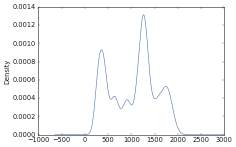

In [237]:
import matplotlib.pyplot as plt
import scipy.stats as stats
from scipy.stats import kurtosis

dataset.GoldPrice.plot(kind = 'density')  

print('Gold: Kurtosis of normal distribution: {}'.format(stats.kurtosis(dataset.GoldPrice)))
print('Gold:Skewness of normal distribution: {}'.format(stats.skew(dataset.GoldPrice)))

These two distributions give us some intuition about the distribution of our data. The kurtosis of this dataset is -0.18. Since this value is less than 0, it is considered to be a light-tailed dataset. It has as much data in each tail as it does in the peak. Moderate skewness refers to the value between -1 and -0.5 or 0.5 and 1.

Silver: Kurtosis of normal distribution: 0.19227608571676047
Silver:Skewness of normal distribution: 0.6126837586238526


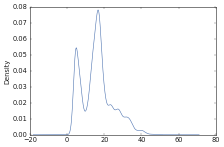

In [238]:
import matplotlib.pyplot as plt
import scipy.stats as stats
from scipy.stats import kurtosis

dataset.SilverPrice.plot(kind = 'density') 

print('Silver: Kurtosis of normal distribution: {}'.format(stats.kurtosis(dataset.SilverPrice)))
print('Silver:Skewness of normal distribution: {}'.format(stats.skew(dataset.SilverPrice)))

These two distributions give us some intuition about the distribution of our data. The kurtosis of this dataset is -0.95. Since this value is less than 0, it is considered to be a light-tailed dataset. It has as much data in each tail as it does in the peak. Moderate skewness refers to the value between -1 and -0.5 or 0.5 and 1.

Oil: Kurtosis of normal distribution: -0.5600656236444612
Oil: Skewness of normal distribution: 0.3488255826856321


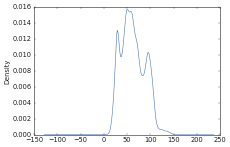

In [239]:
import matplotlib.pyplot as plt
import scipy.stats as stats
from scipy.stats import kurtosis

dataset['CrudeOilPrices(WTI)'].plot(kind = 'density') 

print('Oil: Kurtosis of normal distribution: {}'.format(stats.kurtosis(dataset['CrudeOilPrices(WTI)'])))
print('Oil: Skewness of normal distribution: {}'.format(stats.skew(dataset['CrudeOilPrices(WTI)'])))

These two distributions give us some intuition about the distribution of our data. The kurtosis of this dataset is -1.16. Since this value is less than 0, it is considered to be a light-tailed dataset. It has as much data in each tail as it does in the peak. Moderate skewness refers to the value between -1 and -0.5 or 0.5 and 1.

FEDFUNDS: Kurtosis of normal distribution: 0.6993137735215917
FEDFUNDS: Skewness of normal distribution: 1.3420910816517337


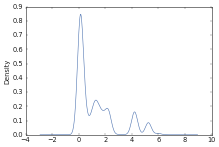

In [240]:
import matplotlib.pyplot as plt
import scipy.stats as stats
from scipy.stats import kurtosis

dataset.FEDFUNDS.plot(kind = 'density') 

print('FEDFUNDS: Kurtosis of normal distribution: {}'.format(stats.kurtosis(dataset.FEDFUNDS)))
print('FEDFUNDS: Skewness of normal distribution: {}'.format(stats.skew(dataset.FEDFUNDS)))

These two distributions give us some intuition about the distribution of our data. The kurtosis of this dataset is -1.43. Since this value is less than 0, it is considered to be a light-tailed dataset. It has as much data in each tail as it does in the peak. Moderate skewness refers to the value between -1 and -0.5 or 0.5 and 1.

count    16667.000000
mean      1048.852292
std        497.064144
min        256.700000
25%        564.000000
50%       1194.000000
75%       1362.600000
max       2061.500000
Name: GoldPrice, dtype: float64

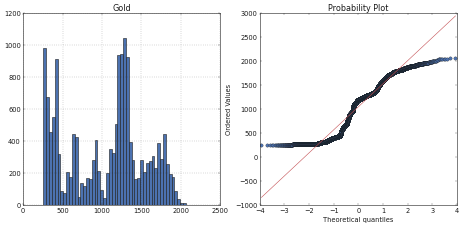

In [241]:
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
dataset['GoldPrice'].hist(bins=50)
plt.title('Gold')
plt.subplot(1,2,2)
stats.probplot(dataset['GoldPrice'], plot=plt);
dataset.GoldPrice.describe().T

Normal probability plot also shows the data is far from normally distributed.

count    16667.000000
mean        16.145373
std          8.419776
min          4.065000
25%          9.665000
50%         16.100000
75%         19.780000
max         48.700000
Name: SilverPrice, dtype: float64

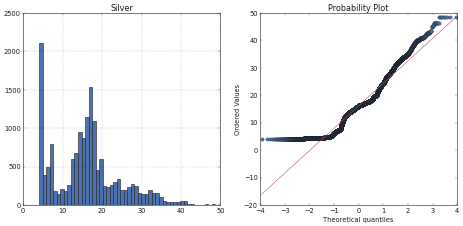

In [242]:
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
dataset['SilverPrice'].hist(bins=50)
plt.title('Silver')
plt.subplot(1,2,2)
stats.probplot(dataset['SilverPrice'], plot=plt);
dataset.SilverPrice.describe().T

Normal probability plot also shows the data is far from normally distributed.

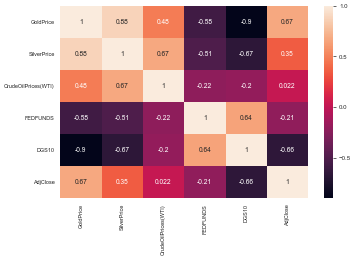

In [243]:

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns; sns.set()
corr = dataset.corr()

fig, ax = plt.subplots()
sns.heatmap(corr,xticklabels=corr.columns.values, yticklabels=corr.columns.values, annot=True,annot_kws={'size':12})
heat_map=plt.gcf()
heat_map.set_size_inches(10,6)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.show()

In [244]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 16667 entries, 2000-11-21 to 2022-03-01
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   GoldPrice            16667 non-null  float64
 1   SilverPrice          16667 non-null  float64
 2   CrudeOilPrices(WTI)  16667 non-null  float64
 3   FEDFUNDS             16667 non-null  float64
 4   DGS10                16667 non-null  float64
 5   AdjClose             16667 non-null  float64
dtypes: float64(6)
memory usage: 911.5 KB


In [245]:
#dataset

### Auto-correlation ###

###### Auto-correlation or serial correlation can be a significant problem in analyzing historical data if we do not know how to look out for it. #######

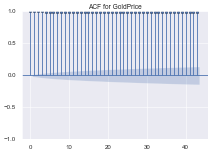

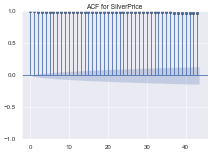

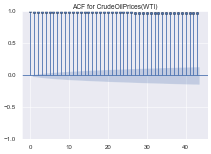

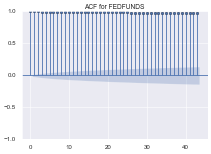

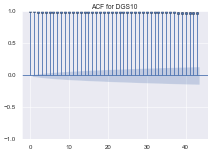

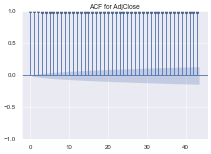

In [246]:
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm

# plots the autocorrelation plots for each stock's price at 50 lags
for i in dataset:
    series = dataset[i]
    sm.graphics.tsa.plot_acf(series)
    plt.title('ACF for %s' % i)
    plt.show()

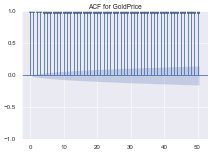

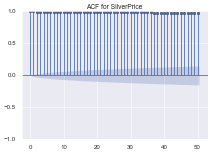

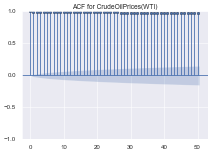

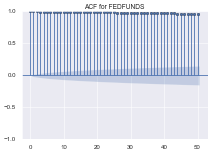

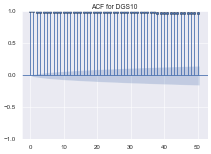

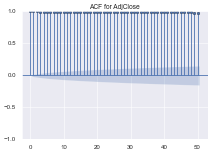

In [247]:
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm

# plots the autocorrelation plots for each stock's price at 50 lags
for i in dataset:
    sm.graphics.tsa.plot_acf(dataset[i], lags = 50)
    plt.title('ACF for %s' % i)
plt.show()

We see here from the above plots, the auto-correlation of +1 which represents a perfect positive correlation which means, an increase seen in one time series leads to a proportionate increase in the other time series. We definitely need to apply transformation and neutralize this to make the series stationary. It measures linear relationships; even if the auto-correlation is minuscule, there may still be a nonlinear relationship between a time series and a lagged version of itself.

In [248]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 16667 entries, 2000-11-21 to 2022-03-01
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   GoldPrice            16667 non-null  float64
 1   SilverPrice          16667 non-null  float64
 2   CrudeOilPrices(WTI)  16667 non-null  float64
 3   FEDFUNDS             16667 non-null  float64
 4   DGS10                16667 non-null  float64
 5   AdjClose             16667 non-null  float64
dtypes: float64(6)
memory usage: 911.5 KB


In [249]:
dataset['AdjClose']

Date
2000-11-21    1347.35
2000-11-21    1347.35
2000-11-21    1347.35
2000-11-22    1347.35
2000-11-22    1322.36
2000-11-22    1322.36
2000-11-23    1322.36
2000-11-23    1322.36
2000-11-23    1322.36
2000-11-24    1322.36
2000-11-24    1341.77
2000-11-24    1341.77
2000-11-27    1348.97
2000-11-27    1348.97
2000-11-27    1348.97
2000-11-28    1348.97
2000-11-28    1336.09
2000-11-28    1336.09
2000-11-29    1336.09
2000-11-29    1341.93
2000-11-29    1341.93
2000-11-30    1314.95
2000-11-30    1314.95
2000-11-30    1314.95
2000-12-01    1315.23
2000-12-01    1315.23
2000-12-01    1315.23
2000-12-04    1315.23
2000-12-04    1315.23
2000-12-04    1324.97
2000-12-05    1324.97
2000-12-05    1324.97
2000-12-05    1376.54
2000-12-06    1376.54
2000-12-06    1351.46
2000-12-06    1351.46
2000-12-07    1351.46
2000-12-07    1351.46
2000-12-07    1343.55
2000-12-08    1343.55
2000-12-08    1369.89
2000-12-08    1369.89
2000-12-11    1369.89
2000-12-11    1369.89
2000-12-11    1380.20
2000-

### Train and Test Data: ###
The VAR model will be fitted on X_train and then used to forecast the next 15 observations. These forecasts will be compared against the actual present in test data.

In [250]:
n_obs=15
X_train, X_test = dataset[0:-n_obs], dataset[-n_obs:]
print(X_train.shape, X_test.shape) 

(16652, 6) (15, 6)


### Transformation: ###

Applying first differencing on training set to make all the series stationary. However, this is an iterative process where we after first differencing, the series may still be non-stationary. We shall have to apply second difference or log transformation to standardize the series in such cases.

In [251]:
transform_data = X_train.diff().dropna()
transform_data.head()

,GoldPrice,SilverPrice,CrudeOilPrices(WTI),FEDFUNDS,DGS10,AdjClose
Date,,,,,,
2000-11-21,0.0,0.000,0.00,0.0,0.00,0.00
2000-11-21,0.0,0.000,0.00,0.0,0.00,0.00
2000-11-22,0.0,0.000,0.00,0.0,-0.05,0.00
2000-11-22,-0.8,-0.028,0.00,0.0,0.00,-24.99
2000-11-22,0.0,0.000,0.52,0.0,0.00,0.00


In [252]:
transform_data.describe()

,GoldPrice,SilverPrice,CrudeOilPrices(WTI),FEDFUNDS,DGS10,AdjClose
count,16651.000000,16651.000000,16651.000000,16651.000000,16651.000000,16651.000000
mean,0.097757,0.001163,0.003397,-0.000347,-0.000224,0.177612
std,7.030722,0.245168,0.999465,0.021076,0.032052,12.538270
min,-133.500000,-6.680000,-55.290000,-0.960000,-0.510000,-324.890000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,105.000000,5.340000,45.890000,0.250000,0.290000,230.380000


### Stationarity check ###


In [253]:
!pip install statsmodels 

In [254]:
import statsmodels.tsa.stattools as sm
def augmented_dickey_fuller_statistics(time_series):
    result = sm.adfuller(time_series.values, autolag='AIC')
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t%s: %.3f' % (key, value))

In [255]:
print('Augmented Dickey-Fuller Test: Gold Price Time Series')
augmented_dickey_fuller_statistics(transform_data['GoldPrice'])
print('Augmented Dickey-Fuller Test: Silver Price Time Series')
augmented_dickey_fuller_statistics(transform_data['SilverPrice'])
print('Augmented Dickey-Fuller Test: CrudeOilPrices(WTI)  Time Series')
augmented_dickey_fuller_statistics(transform_data['CrudeOilPrices(WTI)'])
print('Augmented Dickey-Fuller Test: FEDFUNDS Time Series')
augmented_dickey_fuller_statistics(transform_data['FEDFUNDS'])
print('Augmented Dickey-Fuller Test: DGS10 Time Series')
augmented_dickey_fuller_statistics(transform_data['DGS10'])
print('Augmented Dickey-Fuller Test: AdjClose Time Series')
augmented_dickey_fuller_statistics(transform_data['AdjClose'])

##GoldPrice	SilverPrice	CrudeOilPrices(WTI)	FEDFUNDS	DGS10	AdjClose


Augmented Dickey-Fuller Test: Gold Price Time Series


ADF Statistic: -19.747752
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Augmented Dickey-Fuller Test: Silver Price Time Series
ADF Statistic: -20.213152
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Augmented Dickey-Fuller Test: CrudeOilPrices(WTI)  Time Series
ADF Statistic: -18.495204
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Augmented Dickey-Fuller Test: FEDFUNDS Time Series
ADF Statistic: -19.582564
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Augmented Dickey-Fuller Test: DGS10 Time Series
ADF Statistic: -54.930717
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Augmented Dickey-Fuller Test: AdjClose Time Series
ADF Statistic: -19.339945
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567


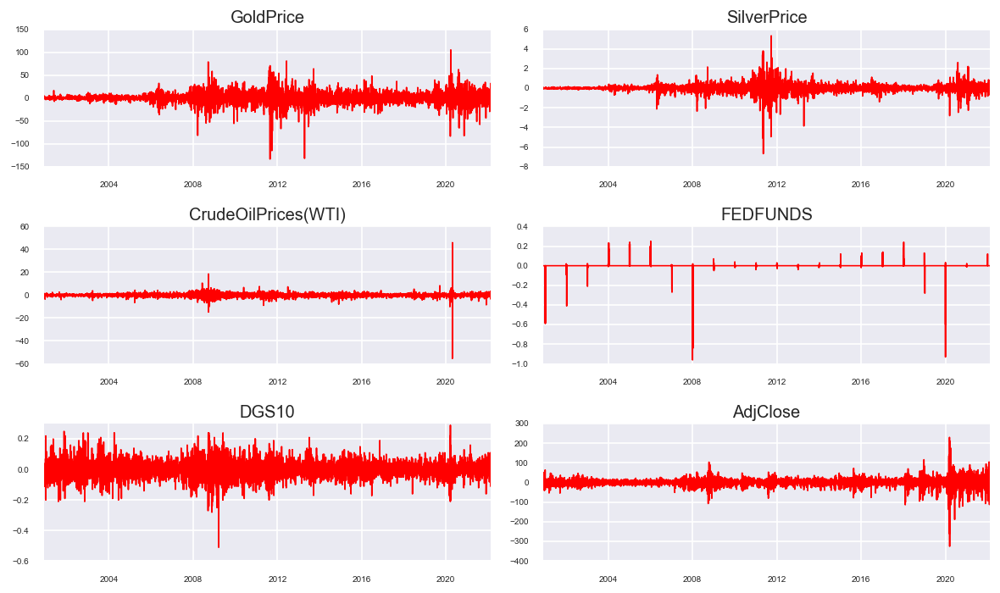

In [256]:
fig, axes = plt.subplots(nrows=3, ncols=2, dpi=120, figsize=(10,6))
for i, ax in enumerate(axes.flatten()):
    d = transform_data[transform_data.columns[i]]
    ax.plot(d, color='red', linewidth=1)
    # Decorations
    ax.set_title(dataset.columns[i])
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines['top'].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout();

### Granger’s Causality Test: ###


The formal definition of Granger causality can be explained as, whether past values of x aid in the prediction of yt, conditional on having already accounted for the effects on yt of past values of y (and perhaps of past values of other variables). If they do, the x is said to “Granger cause” y. So, the basis behind VAR is that each of the time series in the system influences each other.
Granger’s causality Tests the null hypothesis that the coefficients of past values in the regression equation is zero. So, if the p-value obtained from the test is lesser than the significance level of 0.05, then, you can safely reject the null hypothesis. This has been performed on original data-set.

In [257]:
import statsmodels.tsa.stattools as sm
maxlag=12
test = 'ssr-chi2test'
def grangers_causality_matrix(X_train, variables, test = 'ssr_chi2test', verbose=False):
    dataset = pd.DataFrame(np.zeros((len(variables), len(variables))), columns=variables, index=variables)
    for c in dataset.columns:
        for r in dataset.index:
            test_result = sm.grangercausalitytests(X_train[[r,c]], maxlag=maxlag, verbose=False)
            p_values = [round(test_result[i+1][0][test][1],4) for i in range(maxlag)]
            if verbose: print(f'Y = {r}, X = {c}, P Values = {p_values}')
            min_p_value = np.min(p_values)
            dataset.loc[r,c] = min_p_value
    dataset.columns = [var + '_x' for var in variables]
    dataset.index = [var + '_y' for var in variables]
    return dataset



In [258]:
grangers_causality_matrix(dataset, variables = dataset.columns)
## https://rishi-a.github.io/2020/05/25/granger-causality.html
## https://towardsdatascience.com/granger-causality-and-vector-auto-regressive-model-for-time-series-forecasting-3226a64889a6

/Users/mocha/.conda/envs/dataenv/lib/python3.8/site-packages/statsmodels/tsa/stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/Users/mocha/.conda/envs/dataenv/lib/python3.8/site-packages/statsmodels/tsa/stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/Users/mocha/.conda/envs/dataenv/lib/python3.8/site-packages/statsmodels/tsa/stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/Users/mocha/.conda/envs/dataenv/lib/python3.8/site-packages/statsmodels/tsa/stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/Users/mocha/.conda/envs/dataenv/lib/python3.8/site-packages/statsmodels/tsa/stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/Users/mocha/.conda/envs/dataenv/lib/python3.

,GoldPrice_x,SilverPrice_x,CrudeOilPrices(WTI)_x,FEDFUNDS_x,DGS10_x,AdjClose_x
GoldPrice_y,1.000,0.0000,0.0000,0.6590,0.0000,0.0053
SilverPrice_y,0.000,1.0000,0.0000,0.5001,0.0046,0.0000
CrudeOilPrices(WTI)_y,0.000,0.0000,1.0000,0.6586,0.0000,0.0000
FEDFUNDS_y,0.649,0.4585,0.2185,1.0000,0.3324,0.0983
DGS10_y,0.000,0.0013,0.0000,0.1345,1.0000,0.0000
AdjClose_y,0.000,0.0802,0.0000,0.6833,0.0000,1.0000


The row are the response (y) and the columns are the predictor series (x).
* If we take the value 0.0000 in (row 1, column 5), it refers to the p-value of the Granger’s Causality test for InterestRate_x causing Gold_y. The 0.0000 in (row 5, column 1) refers to the p-value of InterestRate_y causing GoldPrice_x and so on.
* We can see that, in the case of Interest and USD variables, we cannot reject null hypothesis e.g. USD & Silver, USD & Oil. 
* Our variables of interest are Gold and Oil here. So, for Gold, all the variables cause but for USD doesn’t causes any effect on Oil.

So, looking at the p-Values, we can assume that, except USD, all the other variables (time series) in the system are interchangeably causing each other. This justifies the VAR modeling approach for this system of multi time-series to forecast.

### VAR model ###

VAR requires stationarity of the series which means the mean to the series do not change over time (we can find this out from the plot drawn next to Augmented Dickey-Fuller Test).


So, I will fit the VAR model on training set and then used the fitted model to forecast the next 15 observations. These forecasts will be compared against the actual present in test data. I have taken the maximum lag (15) to identify the required lags for VAR model.

In [259]:
import numpy as np
import pandas
import statsmodels.api as sm
from statsmodels.tsa.api import VAR

mod = VAR(transform_data)
res = mod.fit(maxlags=15, ic='aic')
print(res.summary())

/Users/mocha/.conda/envs/dataenv/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Wed, 01, Nov, 2023
Time:                     14:46:28
--------------------------------------------------------------------
No. of Equations:         6.00000    BIC:                   -9.15071
Nobs:                     16636.0    HQIC:                  -9.32043
Log likelihood:          -62863.8    FPE:                8.23887e-05
AIC:                     -9.40406    Det(Omega_mle):     7.97357e-05
--------------------------------------------------------------------
Results for equation GoldPrice
                             coefficient       std. error           t-stat            prob
------------------------------------------------------------------------------------------
const                           0.080233         0.054214            1.480           0.139
L1.GoldPrice                   -0.010797         0.010941           -0.987           0.324
L1.SilverPrice  

### Residual plot ###

Residual plot looks normal with constant mean throughout apart from some large fluctuation during 2009, 2011, 2014 etc.

In [260]:
y_fitted = res.fittedvalues
y_fitted

,GoldPrice,SilverPrice,CrudeOilPrices(WTI),FEDFUNDS,DGS10,AdjClose
Date,,,,,,
2000-11-28,-0.899454,-2.837521e-02,0.038463,4.944881e-04,-4.229536e-03,1.242532
2000-11-28,-0.846004,-3.113590e-02,0.030923,-7.594272e-04,-3.410607e-03,-1.418441
2000-11-29,-0.027016,-2.253054e-02,0.315443,-6.713002e-04,-1.596115e-03,0.129217
2000-11-29,-0.096406,-3.130254e-02,-0.092322,2.397286e-04,1.307447e-03,-0.478764
2000-11-29,0.355590,-3.509872e-03,0.069432,8.553536e-05,4.023547e-05,0.432876
2000-11-30,0.958834,1.261030e-02,-0.049735,2.918198e-05,-4.690520e-04,-1.596315
2000-11-30,0.806427,1.073660e-02,-0.143535,-2.431944e-04,-6.607955e-03,-0.992034
2000-11-30,0.094249,-2.497166e-02,-0.094434,-2.460028e-06,-2.415894e-03,0.064829
2000-12-01,1.117172,-2.420811e-03,-0.116706,-7.566846e-06,-2.870123e-05,-3.171183


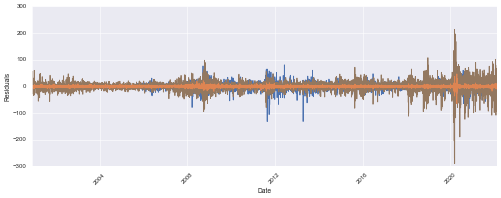

In [261]:
y_fitted = res.fittedvalues
residuals = res.resid
plt.figure(figsize = (15,5))
plt.plot(residuals, label='resid')
plt.plot(y_fitted, label='VAR prediction')
plt.xlabel('Date')
plt.xticks(rotation=45)
plt.ylabel('Residuals')
plt.grid(True)

### Durbin-Watson Statistic ###
The Durbin-Watson statistic will always have a value between 0 and 4. A value of 2.0 means that there is no auto-correlation detected in the sample. Values from 0 to less than 2 indicate positive auto-correlation and values from 2 to 4 indicate negative auto-correlation. A rule of thumb is that test statistic values in the range of 1.5 to 2.5 are relatively normal. Any value outside this range could be a cause for concern.

###### A stock price displaying positive auto-correlation would indicate that the price yesterday has a positive correlation on the price today — so if the stock fell yesterday, it is also likely that it falls today. A stock that has a negative auto-correlation, on the other hand, has a negative influence on itself over time — so that if it fell yesterday, there is a greater likelihood it will rise today. ######

In [262]:
from statsmodels.stats.stattools import durbin_watson
out = durbin_watson(res.resid)
for col,val in zip(transform_data.columns, out):
    print((col), ":", round(val,2))
    

GoldPrice : 2.0
SilverPrice : 2.0
CrudeOilPrices(WTI) : 2.0
FEDFUNDS : 2.0
DGS10 : 2.0
AdjClose : 2.0


#### There is no auto-correlation (2.0) exist; so, we can proceed with the forecast. ####

#### Prediction: #### 
In order to forecast, the VAR model expects up to the lag order number of observations from the past data. This is because, the terms in the VAR model are essentially the lags of the various time series in the data-set, so we need to provide as many of the previous values as indicated by the lag order used by the model.

In [263]:
# Get the lag order
lag_order = res.k_ar
print(lag_order)
# Input data for forecasting
input_data = transform_data.values[-lag_order:]
print(input_data)
# forecasting
pred = res.forecast(y=input_data, steps=n_obs)
pred = (pd.DataFrame(pred, index=X_test.index, columns=X_test.columns + '_pred'))
print(pred)

15
[[-7.000e-01  2.150e-01  0.000e+00  0.000e+00  0.000e+00  3.940e+00]
 [ 0.000e+00  0.000e+00  1.760e+00  0.000e+00  0.000e+00  0.000e+00]
 [ 0.000e+00  0.000e+00  0.000e+00  0.000e+00 -2.000e-02  0.000e+00]
 [ 0.000e+00  0.000e+00 -2.050e+00  0.000e+00  0.000e+00  0.000e+00]
 [ 0.000e+00  0.000e+00  0.000e+00  0.000e+00 -6.000e-02  0.000e+00]
 [ 3.215e+01  8.500e-02  0.000e+00  0.000e+00  0.000e+00 -9.475e+01]
 [ 0.000e+00  0.000e+00  0.000e+00  0.000e+00 -5.000e-02  0.000e+00]
 [ 0.000e+00  0.000e+00 -5.200e-01  0.000e+00  0.000e+00  0.000e+00]
 [ 4.000e-01  1.850e-01  0.000e+00  0.000e+00  0.000e+00 -3.139e+01]
 [ 0.000e+00  0.000e+00  0.000e+00  0.000e+00  0.000e+00  0.000e+00]
 [ 0.000e+00  0.000e+00  0.000e+00  0.000e+00  0.000e+00  0.000e+00]
 [ 8.500e+00 -3.500e-02  0.000e+00  0.000e+00  0.000e+00  0.000e+00]
 [-4.500e-01  2.750e-01  0.000e+00  0.000e+00  0.000e+00 -4.411e+01]
 [ 0.000e+00  0.000e+00  0.000e+00  0.000e+00  2.000e-02  0.000e+00]
 [ 0.000e+00  0.000e+00  8.500e

In [264]:
print(X_test.index)

DatetimeIndex(['2022-02-23', '2022-02-23', '2022-02-23', '2022-02-24',
               '2022-02-24', '2022-02-24', '2022-02-25', '2022-02-25',
               '2022-02-25', '2022-02-28', '2022-02-28', '2022-02-28',
               '2022-03-01', '2022-03-01', '2022-03-01'],
              dtype='datetime64[ns]', name='Date', freq=None)


#### Invert the transformation: ####

The forecasts are generated but it is on the scale of the training data used by the model. So, to bring it back up to its original scale, we need to de-difference it.
The way to convert the differencing is to add these differences consecutively to the base number. An easy way to do it is to first determine the cumulative sum at index and then add it to the base number.
This process can be reversed by adding the observation at the prior time step to the difference value. inverted(ts) = differenced(ts) + observation(ts-1)

In [265]:
# inverting transformation
def invert_transformation(X_train, pred):
    forecast = pred.copy()
    columns = X_train.columns
    for col in columns:
        forecast[str(col)+'_pred'] = X_train[col].iloc[-1] + forecast[str(col)+'_pred'].cumsum()
        return forecast

output = invert_transformation(X_train, pred)

## https://stackoverflow.com/questions/20461165/how-to-convert-index-of-a-pandas-dataframe-into-a-column
output['Date'] = output.index

print(output)

            GoldPrice_pred  SilverPrice_pred  CrudeOilPrices(WTI)_pred  \
Date                                                                     
2022-02-23     1896.187512          0.015705                 -0.089196   
2022-02-23     1895.963781         -0.030477                  0.025705   
2022-02-23     1895.275199         -0.001488                 -0.340664   
2022-02-24     1893.403889         -0.056581                 -0.009884   
2022-02-24     1892.353776         -0.053083                  0.093605   
2022-02-24     1889.816681         -0.077352                 -0.068646   
2022-02-25     1889.894333          0.025856                  0.016620   
2022-02-25     1890.110958         -0.003444                 -0.100469   
2022-02-25     1890.059060          0.004143                 -0.152130   
2022-02-28     1889.252034         -0.033168                  0.036560   
2022-02-28     1889.000946         -0.009888                  0.101732   
2022-02-28     1889.425472          0.

In [266]:
output.columns

Index(['GoldPrice_pred', 'SilverPrice_pred', 'CrudeOilPrices(WTI)_pred',
       'FEDFUNDS_pred', 'DGS10_pred', 'AdjClose_pred', 'Date'],
      dtype='object')

In [267]:
output.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 15 entries, 2022-02-23 to 2022-03-01
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   GoldPrice_pred            15 non-null     float64       
 1   SilverPrice_pred          15 non-null     float64       
 2   CrudeOilPrices(WTI)_pred  15 non-null     float64       
 3   FEDFUNDS_pred             15 non-null     float64       
 4   DGS10_pred                15 non-null     float64       
 5   AdjClose_pred             15 non-null     float64       
 6   Date                      15 non-null     datetime64[ns]
dtypes: datetime64[ns](1), float64(6)
memory usage: 960.0 bytes


In [268]:
print(output['GoldPrice_pred'])

Date
2022-02-23    1896.187512
2022-02-23    1895.963781
2022-02-23    1895.275199
2022-02-24    1893.403889
2022-02-24    1892.353776
2022-02-24    1889.816681
2022-02-25    1889.894333
2022-02-25    1890.110958
2022-02-25    1890.059060
2022-02-28    1889.252034
2022-02-28    1889.000946
2022-02-28    1889.425472
2022-03-01    1889.059307
2022-03-01    1889.251694
2022-03-01    1889.390586
Name: GoldPrice_pred, dtype: float64


In [269]:
output

,GoldPrice_pred,SilverPrice_pred,CrudeOilPrices(WTI)_pred,FEDFUNDS_pred,DGS10_pred,AdjClose_pred,Date
Date,,,,,,,
2022-02-23,1896.187512,0.015705,-0.089196,0.000960,-0.003619,3.255368,2022-02-23
2022-02-23,1895.963781,-0.030477,0.025705,-0.001448,0.008579,-1.675259,2022-02-23
2022-02-23,1895.275199,-0.001488,-0.340664,-0.000655,-0.000079,7.807214,2022-02-23
2022-02-24,1893.403889,-0.056581,-0.009884,-0.000965,0.002230,1.266549,2022-02-24
2022-02-24,1892.353776,-0.053083,0.093605,-0.000319,0.004461,1.826095,2022-02-24
2022-02-24,1889.816681,-0.077352,-0.068646,-0.001518,-0.001621,-1.093807,2022-02-24
2022-02-25,1889.894333,0.025856,0.016620,-0.001343,-0.002239,2.178346,2022-02-25
2022-02-25,1890.110958,-0.003444,-0.100469,-0.000453,0.002873,-0.532072,2022-02-25
2022-02-25,1890.059060,0.004143,-0.152130,-0.001113,0.000039,1.329846,2022-02-25


In [270]:
#combining predicted and real data set
combine = pd.concat([output['GoldPrice_pred'], X_test['GoldPrice']], axis=1)
combine['accuracy'] = round(combine.apply(lambda row: row.GoldPrice_pred /row.GoldPrice *100, axis = 1),2)
combine['accuracy'] = pd.Series(["{0:.2f}%".format(val) for val in combine['accuracy']],index = combine.index)
combine = combine.round(decimals=2)
combine = combine.reset_index()
combine = combine.sort_values(by='Date', ascending=False)

print(combine)

         Date  GoldPrice_pred  GoldPrice accuracy
12 2022-03-01         1889.06    1903.30   99.25%
13 2022-03-01         1889.25    1920.45   98.38%
14 2022-03-01         1889.39    1920.45   98.38%
9  2022-02-28         1889.25    1903.30   99.26%
10 2022-02-28         1889.00    1903.30   99.25%
11 2022-02-28         1889.43    1903.30   99.27%
6  2022-02-25         1889.89    1912.15   98.84%
7  2022-02-25         1890.11    1912.15   98.85%
8  2022-02-25         1890.06    1912.15   98.84%
3  2022-02-24         1893.40    1968.35   96.19%
4  2022-02-24         1892.35    1968.35   96.14%
5  2022-02-24         1889.82    1968.35   96.01%
0  2022-02-23         1896.19    1895.70  100.03%
1  2022-02-23         1895.96    1895.70  100.01%
2  2022-02-23         1895.28    1895.70   99.98%


In [271]:
# old
#combining predicted and real data set
combine = pd.concat([output['GoldPrice_pred'], X_test['GoldPrice']], axis=1)
combine['accuracy'] = round(combine.apply(lambda row: row.GoldPrice_pred /row.GoldPrice *100, axis = 1),2)
combine['accuracy'] = pd.Series(["{0:.2f}%".format(val) for val in combine['accuracy']],index = combine.index)
combine = combine.round(decimals=2)
combine = combine.reset_index()
combine = combine.sort_values(by='Date', ascending=False)

print(combine)

         Date  GoldPrice_pred  GoldPrice accuracy
12 2022-03-01         1889.06    1903.30   99.25%
13 2022-03-01         1889.25    1920.45   98.38%
14 2022-03-01         1889.39    1920.45   98.38%
9  2022-02-28         1889.25    1903.30   99.26%
10 2022-02-28         1889.00    1903.30   99.25%
11 2022-02-28         1889.43    1903.30   99.27%
6  2022-02-25         1889.89    1912.15   98.84%
7  2022-02-25         1890.11    1912.15   98.85%
8  2022-02-25         1890.06    1912.15   98.84%
3  2022-02-24         1893.40    1968.35   96.19%
4  2022-02-24         1892.35    1968.35   96.14%
5  2022-02-24         1889.82    1968.35   96.01%
0  2022-02-23         1896.19    1895.70  100.03%
1  2022-02-23         1895.96    1895.70  100.01%
2  2022-02-23         1895.28    1895.70   99.98%


#### Evaluation: #### 
To evaluate the forecasts, a comprehensive set of metrics, such as the MAPE, ME, MAE, MPE and RMSE can be computed. We have computed some of these as below.

In [272]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
import math
#Forecast bias
forecast_errors = [combine['GoldPrice'][i]- combine['GoldPrice_pred'][i] for i in range(len(combine['GoldPrice']))]
bias = sum(forecast_errors) * 1.0/len(combine['GoldPrice'])

print('Bias: %f' % bias) 
print('Mean absolute error:', mean_absolute_error(combine['GoldPrice'].values, combine['GoldPrice_pred'].values))
print('Mean squared error:', mean_squared_error(combine['GoldPrice'].values, combine['GoldPrice_pred'].values))
print('Root mean squared error:', math.sqrt(mean_squared_error(combine['GoldPrice'].values, combine['GoldPrice_pred'].values)))

Bias: 27.617333
Mean absolute error: 27.717333333333332
Mean squared error: 1451.0263599999982
Root mean squared error: 38.09233991237606


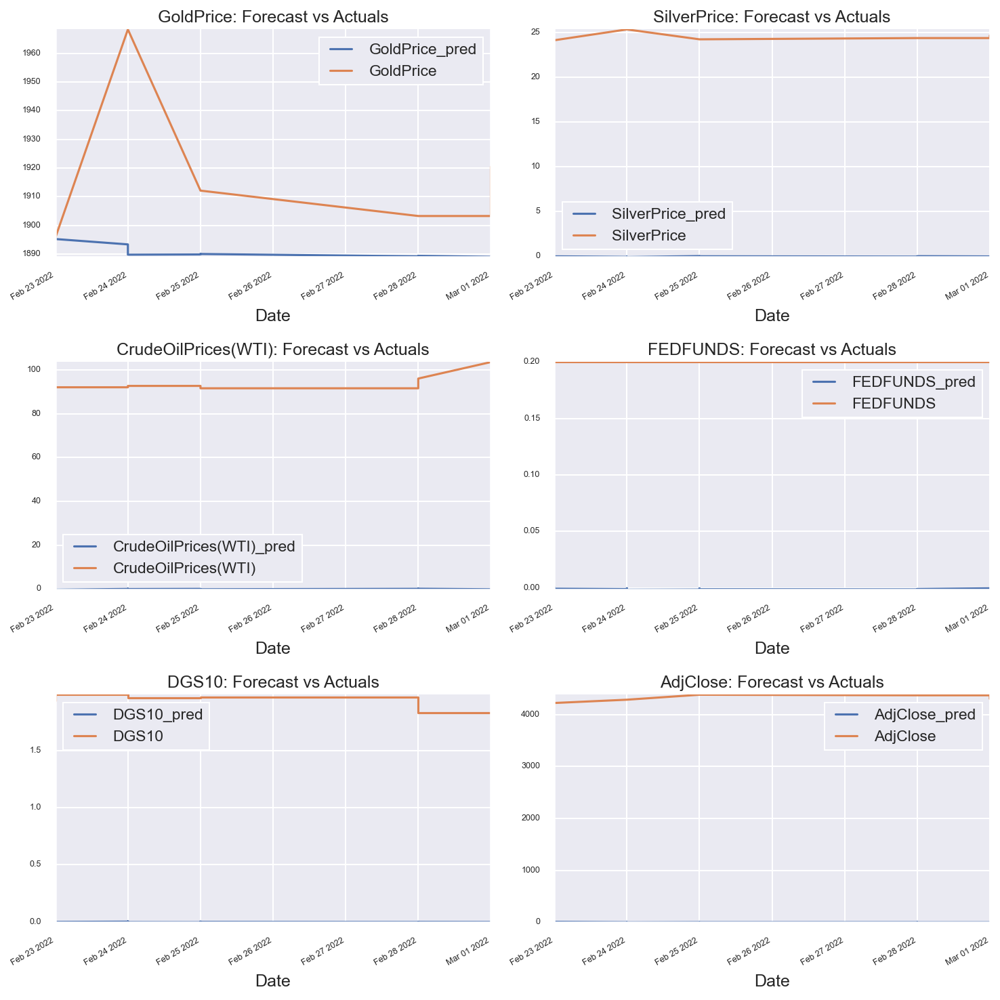

In [273]:
## https://www.machinelearningplus.com/time-series/vector-autoregression-examples-python/

fig, axes = plt.subplots(nrows=int(len(dataset.columns)/2), ncols=2, dpi=150, figsize=(10,10))
for i, (col,ax) in enumerate(zip(dataset.columns, axes.flatten())):
    output[col+'_pred'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    X_test[col][-n_obs:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout();

#### Summary #### 

The VAR model is a popular tool for the purpose of predicting joint dynamics of multiple time series based on linear functions of past observations. More analysis e.g. impulse response (IRF) and forecast error variance decomposition (FEVD) can also be done along-with VAR to for assessing the impacts of shock from one asset on another to assess the impacts of shock from one asset on another. However, I will keep this simple here for easy understanding. In real-life business case, we should do multiple models with different approach to do the comparative analysis before zeroed down on one or a hybrid model.


### Prophet In Action ###

In [274]:
# Time Series
# https://dev.socrata.com/blog/2019/10/07/time-series-analysis-with-jupyter-notebooks-and-socrata.html

# Data Source
# Building Permits
# https://data.seattle.gov/Permitting/Building-Permits/76t5-zqzr

dataset.info()
df3=dataset

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 16667 entries, 2000-11-21 to 2022-03-01
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   GoldPrice            16667 non-null  float64
 1   SilverPrice          16667 non-null  float64
 2   CrudeOilPrices(WTI)  16667 non-null  float64
 3   FEDFUNDS             16667 non-null  float64
 4   DGS10                16667 non-null  float64
 5   AdjClose             16667 non-null  float64
dtypes: float64(6)
memory usage: 911.5 KB


In [275]:
dataset.index

DatetimeIndex(['2000-11-21', '2000-11-21', '2000-11-21', '2000-11-22',
               '2000-11-22', '2000-11-22', '2000-11-23', '2000-11-23',
               '2000-11-23', '2000-11-24',
               ...
               '2022-02-24', '2022-02-25', '2022-02-25', '2022-02-25',
               '2022-02-28', '2022-02-28', '2022-02-28', '2022-03-01',
               '2022-03-01', '2022-03-01'],
              dtype='datetime64[ns]', name='Date', length=16667, freq=None)

In [276]:
from fbprophet import Prophet
model = Prophet()
train_df = df3.rename(columns={"GoldPrice":'y'})
train_df["ds"] = train_df.index
model.fit(train_df)

ModuleNotFoundError: No module named 'fbprophet'

In [ ]:
pd.plotting.register_matplotlib_converters()

# We want to forecast over the next 5 months
future = model.make_future_dataframe(30, freq='D', include_history=True)
forecast = model.predict(future)
model.plot(forecast)

In [ ]:
forecast